<a href="https://colab.research.google.com/github/farghea/database_for_mechanical_mechanism/blob/main/1-%20fine_tuning_stable_diffusion_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import zipfile
import os

def unzip_file(zip_path, extract_to):
    """
    Unzips a file from zip_path to the directory specified in extract_to.

    :param zip_path: Path to the zip file
    :param extract_to: Directory where the contents should be extracted
    """
    if not os.path.exists(zip_path):
        print(f"The file {zip_path} does not exist.")
        return

    if not os.path.exists(extract_to):
        os.makedirs(extract_to)

    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to)
        print(f"Extracted all files to {extract_to}")


unzip_file(
    zip_path='/content/drive/MyDrive/gen mech mecanism/combined_dataset.zip',
    extract_to='/content')



In [ ]:
!pip uninstall -y torchtext fastai

Found existing installation: torchtext 0.18.0
Uninstalling torchtext-0.18.0:
  Successfully uninstalled torchtext-0.18.0
Found existing installation: fastai 2.7.16
Uninstalling fastai-2.7.16:
  Successfully uninstalled fastai-2.7.16


In [ ]:
!git clone https://github.com/huggingface/diffusers


Cloning into 'diffusers'...
remote: Enumerating objects: 68252, done.
remote: Counting objects: 100% (14467/14467), done.
remote: Compressing objects: 100% (1347/1347), done.
remote: Total 68252 (delta 13907), reused 13257 (delta 13058), pack-reused 53785 (from 1)
Receiving objects: 100% (68252/68252), 47.74 MiB | 15.60 MiB/s, done.
Resolving deltas: 100% (50714/50714), done.


In [ ]:
%cd diffusers


/content/diffusers


In [ ]:
!pip install .


Processing /content/diffusers
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for diffusers: filename=diffusers-0.31.0.dev0-py3-none-any.whl size=2659086 sha256=aa1a206ad913ccfd4e66db4bd5a1fe0648e9692381ac49ba2f49192f58047a37
  Stored in directory: /tmp/pip-ephem-wheel-cache-ea8nnj3r/wheels/95/c5/3b/e1b4269f8a2584de57e75f949a185b48fc4144e9a91fc9965a
Successfully built diffusers


In [ ]:
%cd /content/diffusers/examples/text_to_image


/content/diffusers/examples/text_to_image


In [ ]:
!pip install -r requirements.txt


  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [ ]:
!accelerate config
# press enter for all


In [ ]:
from huggingface_hub import notebook_login

notebook_login()

In [ ]:
!pwd

In [ ]:
!accelerate launch --mixed_precision="fp16" train_text_to_image.py \
  --pretrained_model_name_or_path="CompVis/stable-diffusion-v1-4" \
  --train_data_dir="/content/combined_dataset" \
  --use_ema \
  --resolution=256 --center_crop --random_flip \
  --train_batch_size=128 \
  --gradient_accumulation_steps=4 \
  --gradient_checkpointing \
  --max_train_steps=2 \
  --learning_rate=1e-05 \
  --max_grad_norm=1 \
  --lr_scheduler="constant" --lr_warmup_steps=0 \
  --output_dir="fine-tune-mechanism-model2"




In [ ]:
import os
import shutil

model_result_folder = 'fine-tune-mechanism-model2'

cwd = os.getcwd()
origin_folder = os.path.join(cwd, model_result_folder)
destination_folder = '/content/drive/MyDrive/gen mech mecanism/trained models'

if not os.path.exists(destination_folder):
    os.makedirs(destination_folder)
else:
    print(f"Directory {destination_folder} already exists.")

destination_path = os.path.join(destination_folder, model_result_folder)

if os.path.exists(destination_path):
    shutil.rmtree(destination_path)
    print(f"Removed existing directory {destination_path}.")

shutil.copytree(origin_folder, destination_path)
print(f"Copied {origin_folder} to {destination_path}.")

model_path = destination_path


In [1]:
# if you want to use my final check point first download it from this gdrive link:
# https://drive.google.com/drive/folders/16GzIl8GMZE0bnGusetIYxZxOlZal97Z2?usp=sharing
# then change the "model_path" based on the downloaded directory

from diffusers import StableDiffusionPipeline
import torch
import matplotlib.pyplot as plt

# model_path = "sd-pokemon-model"
pipe = StableDiffusionPipeline.from_pretrained(model_path, torch_dtype=torch.float16)
pipe.to("cuda")


ModuleNotFoundError: No module named 'diffusers'

/content


  0%|          | 0/50 [00:00<?, ?it/s]

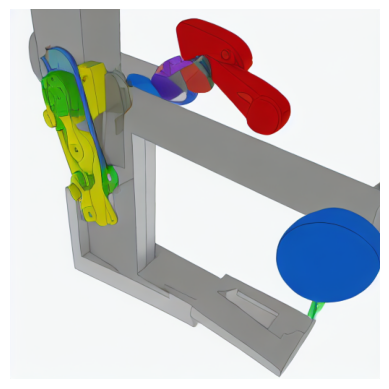

  0%|          | 0/50 [00:00<?, ?it/s]

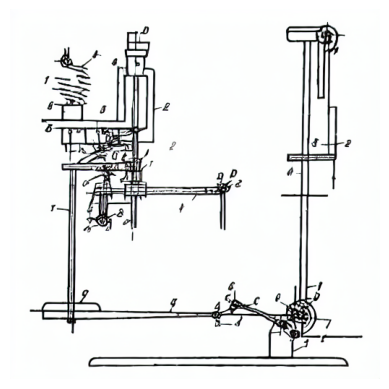

  0%|          | 0/50 [00:00<?, ?it/s]

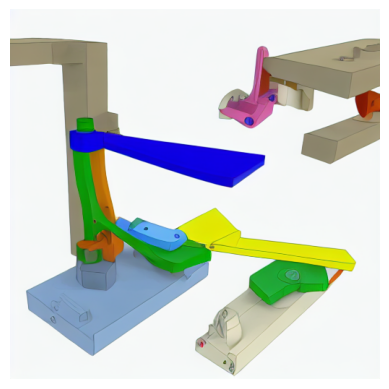

  0%|          | 0/50 [00:00<?, ?it/s]

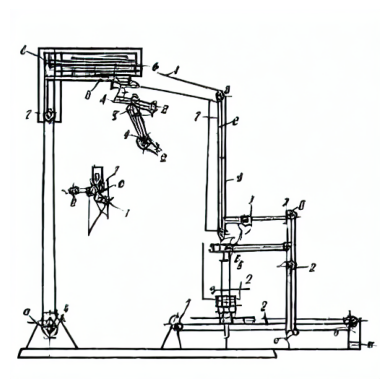

  0%|          | 0/50 [00:00<?, ?it/s]

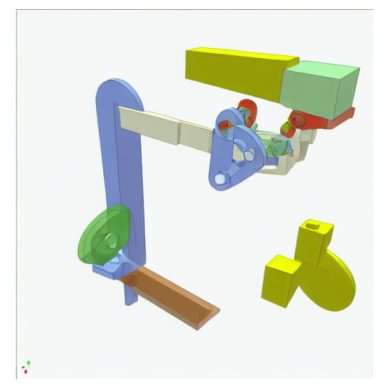

  0%|          | 0/50 [00:00<?, ?it/s]

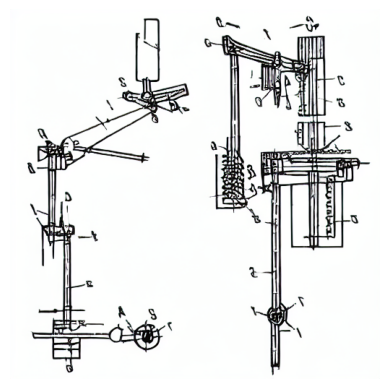

  0%|          | 0/50 [00:00<?, ?it/s]

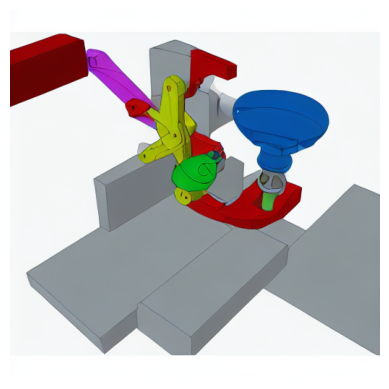

  0%|          | 0/50 [00:00<?, ?it/s]

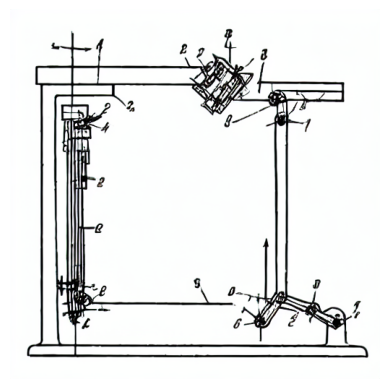

  0%|          | 0/50 [00:00<?, ?it/s]

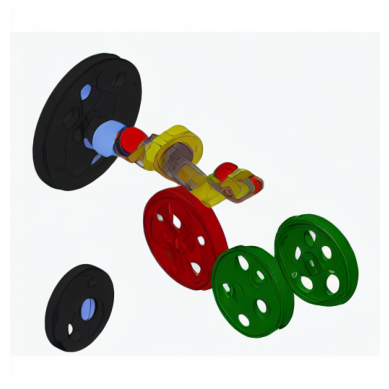

  0%|          | 0/50 [00:00<?, ?it/s]

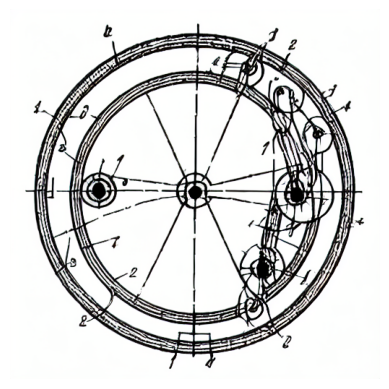

  0%|          | 0/50 [00:00<?, ?it/s]

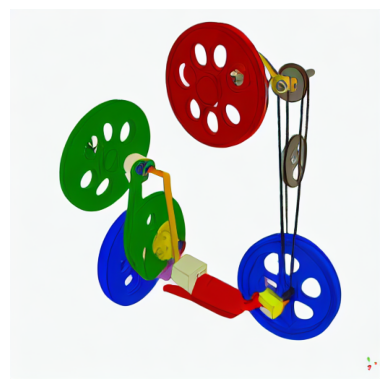

  0%|          | 0/50 [00:00<?, ?it/s]

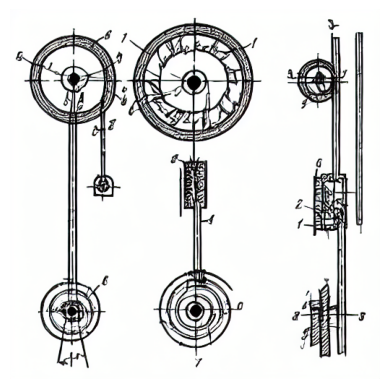

  0%|          | 0/50 [00:00<?, ?it/s]

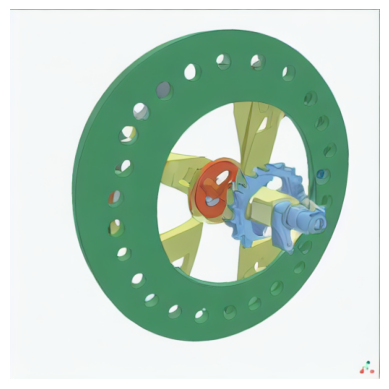

  0%|          | 0/50 [00:00<?, ?it/s]

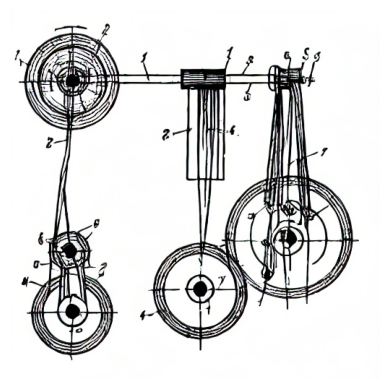

  0%|          | 0/50 [00:00<?, ?it/s]

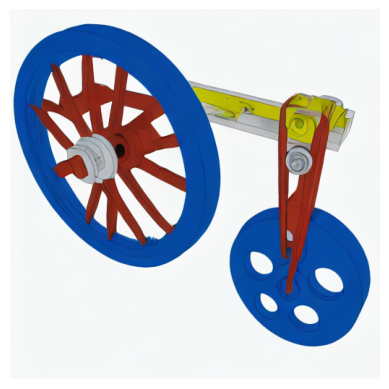

  0%|          | 0/50 [00:00<?, ?it/s]

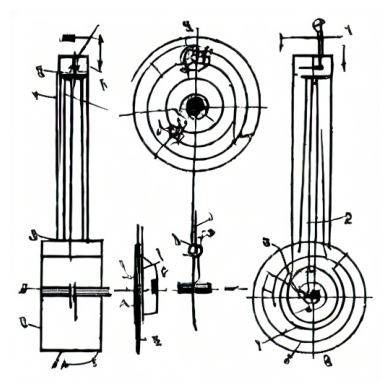

  0%|          | 0/50 [00:00<?, ?it/s]

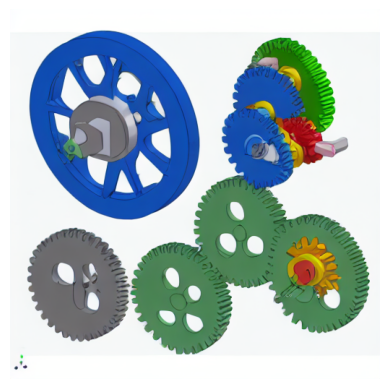

  0%|          | 0/50 [00:00<?, ?it/s]

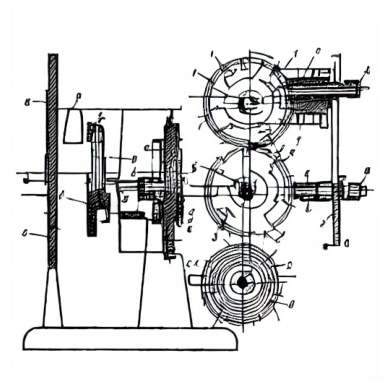

  0%|          | 0/50 [00:00<?, ?it/s]

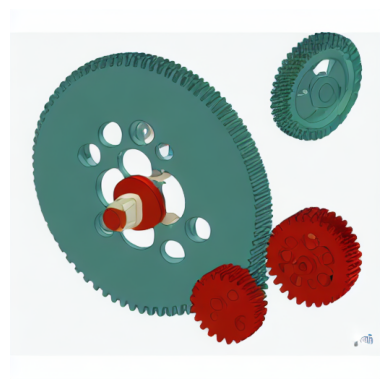

  0%|          | 0/50 [00:00<?, ?it/s]

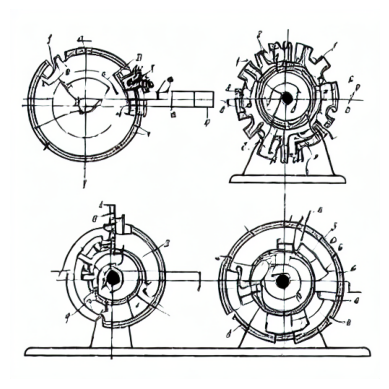

  0%|          | 0/50 [00:00<?, ?it/s]

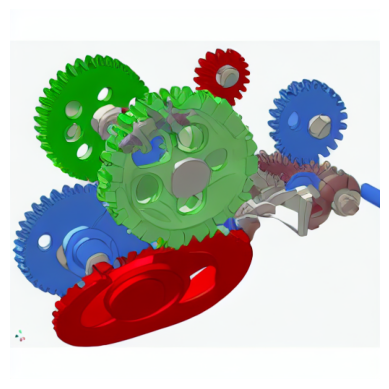

  0%|          | 0/50 [00:00<?, ?it/s]

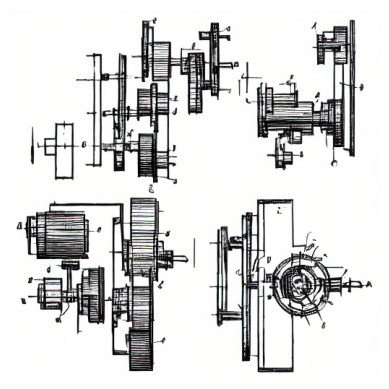

  0%|          | 0/50 [00:00<?, ?it/s]

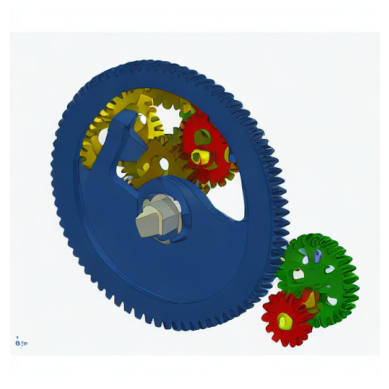

  0%|          | 0/50 [00:00<?, ?it/s]

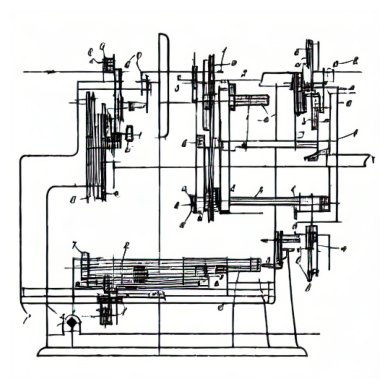

  0%|          | 0/50 [00:00<?, ?it/s]

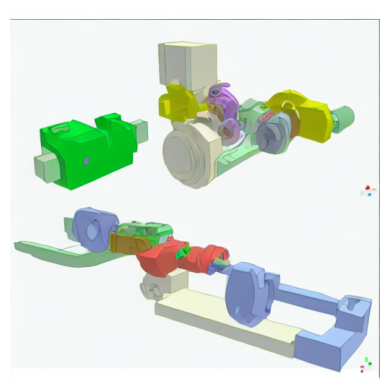

  0%|          | 0/50 [00:00<?, ?it/s]

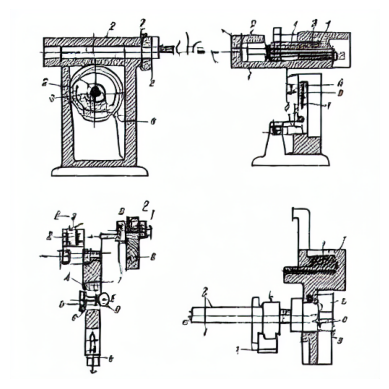

  0%|          | 0/50 [00:00<?, ?it/s]

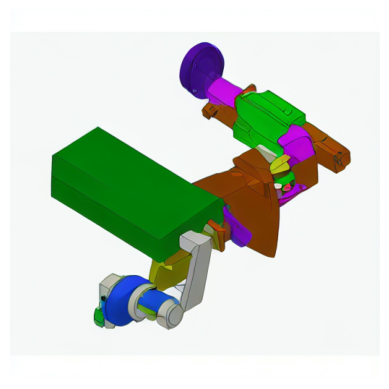

  0%|          | 0/50 [00:00<?, ?it/s]

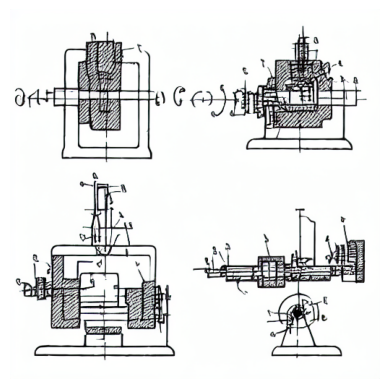

  0%|          | 0/50 [00:00<?, ?it/s]

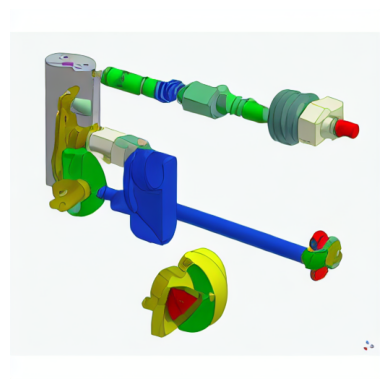

  0%|          | 0/50 [00:00<?, ?it/s]

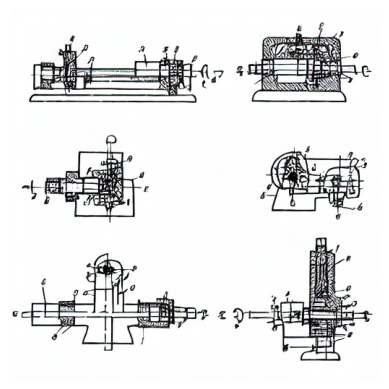

  0%|          | 0/50 [00:00<?, ?it/s]

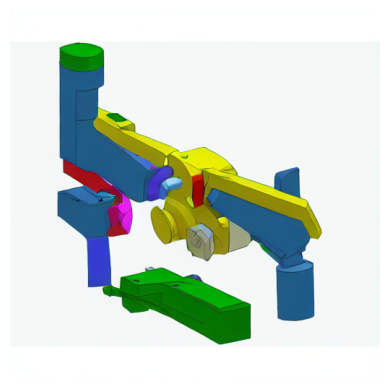

  0%|          | 0/50 [00:00<?, ?it/s]

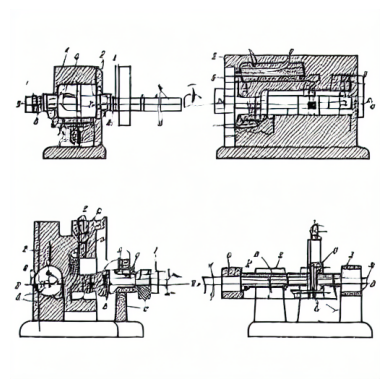

  0%|          | 0/50 [00:00<?, ?it/s]

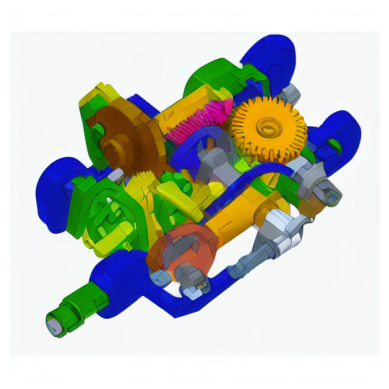

  0%|          | 0/50 [00:00<?, ?it/s]

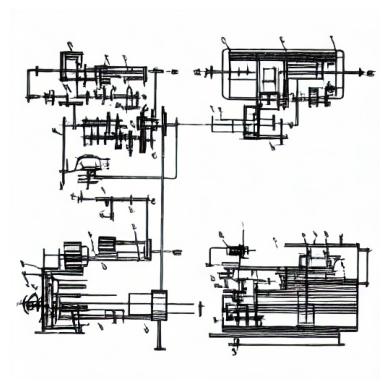

  0%|          | 0/50 [00:00<?, ?it/s]

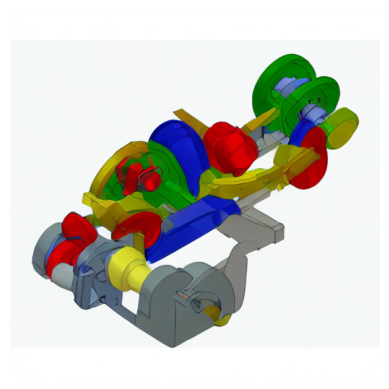

  0%|          | 0/50 [00:00<?, ?it/s]

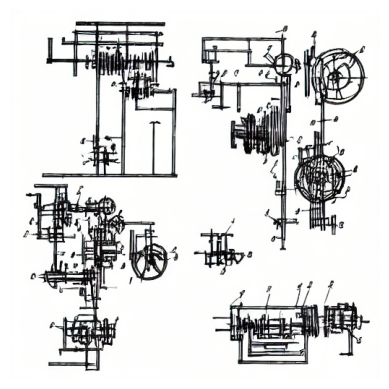

  0%|          | 0/50 [00:00<?, ?it/s]

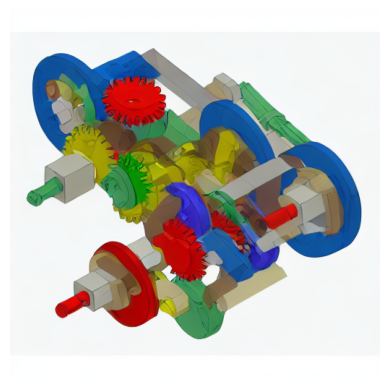

  0%|          | 0/50 [00:00<?, ?it/s]

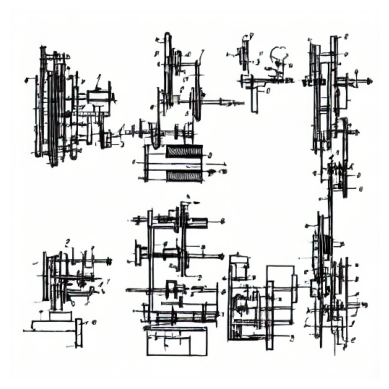

  0%|          | 0/50 [00:00<?, ?it/s]

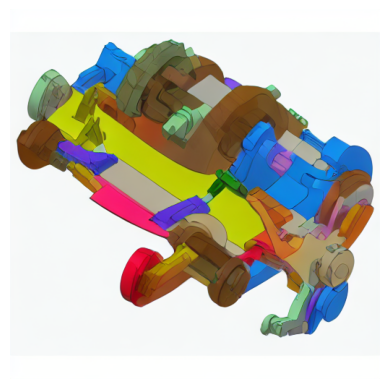

  0%|          | 0/50 [00:00<?, ?it/s]

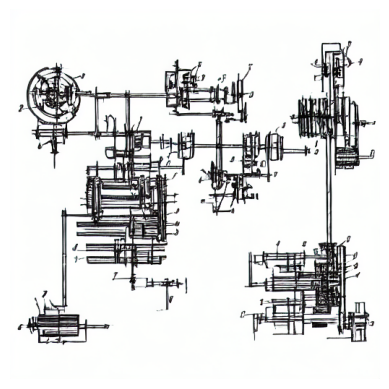

  0%|          | 0/50 [00:00<?, ?it/s]

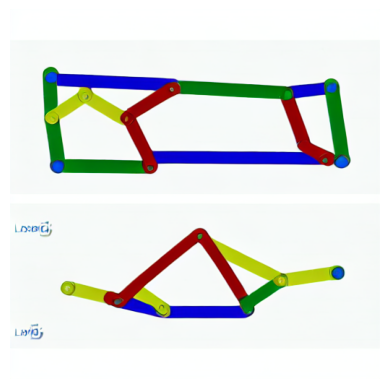

  0%|          | 0/50 [00:00<?, ?it/s]

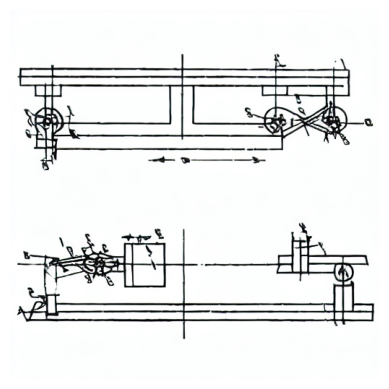

  0%|          | 0/50 [00:00<?, ?it/s]

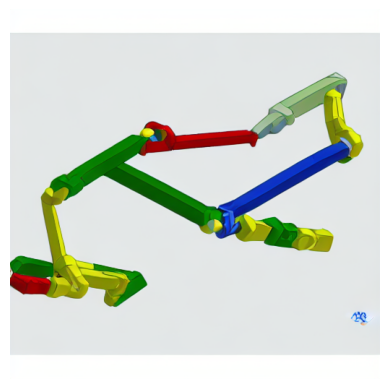

  0%|          | 0/50 [00:00<?, ?it/s]

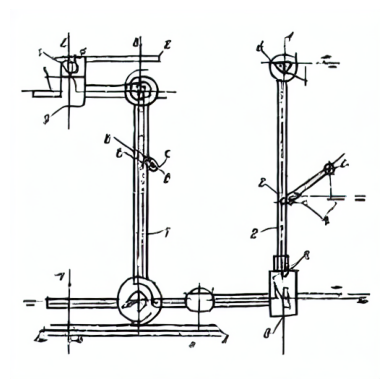

  0%|          | 0/50 [00:00<?, ?it/s]

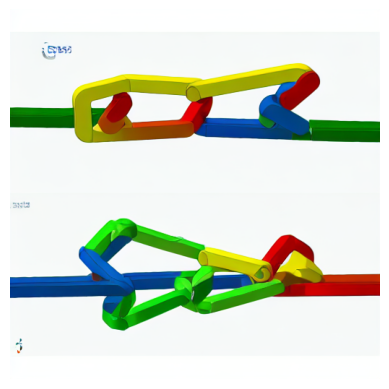

  0%|          | 0/50 [00:00<?, ?it/s]

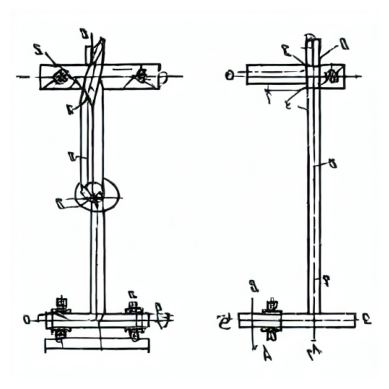

  0%|          | 0/50 [00:00<?, ?it/s]

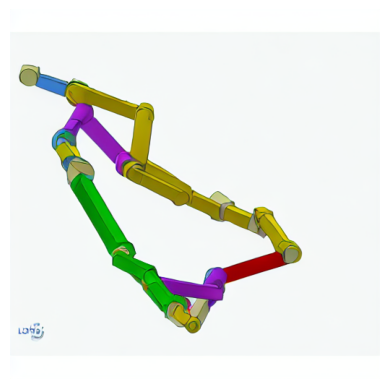

  0%|          | 0/50 [00:00<?, ?it/s]

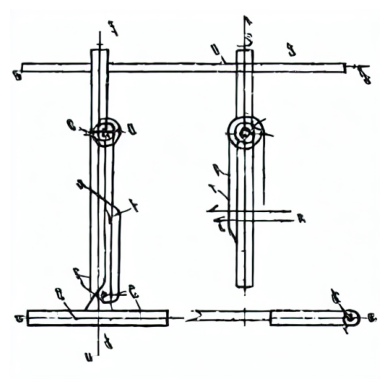

  0%|          | 0/50 [00:00<?, ?it/s]

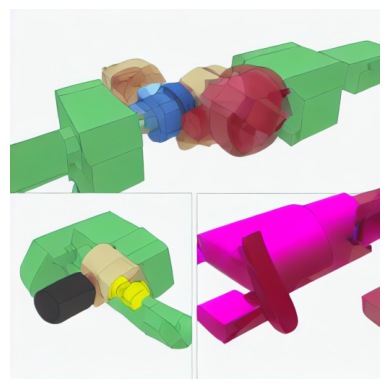

  0%|          | 0/50 [00:00<?, ?it/s]

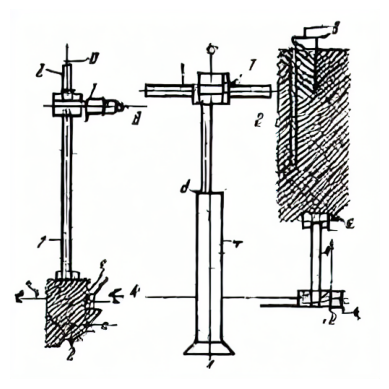

  0%|          | 0/50 [00:00<?, ?it/s]

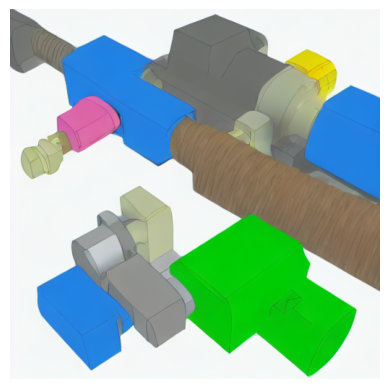

  0%|          | 0/50 [00:00<?, ?it/s]

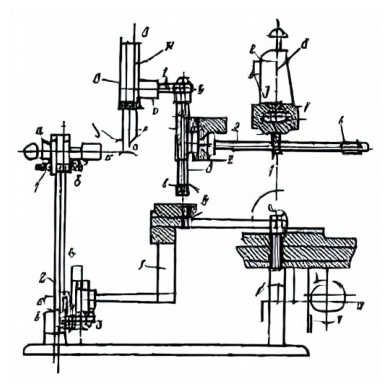

  0%|          | 0/50 [00:00<?, ?it/s]

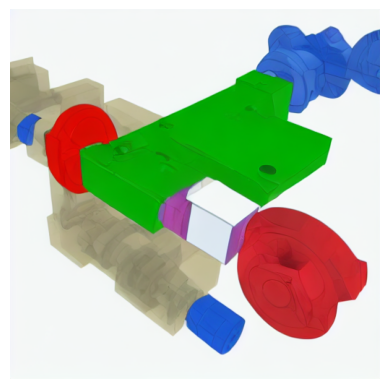

  0%|          | 0/50 [00:00<?, ?it/s]

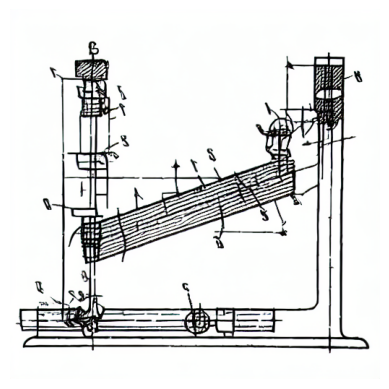

  0%|          | 0/50 [00:00<?, ?it/s]

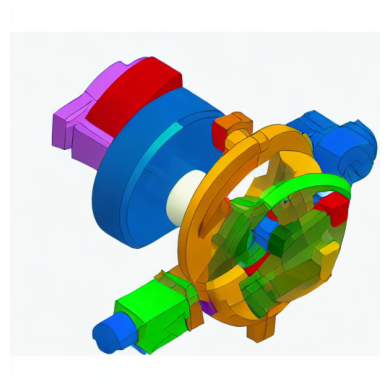

  0%|          | 0/50 [00:00<?, ?it/s]

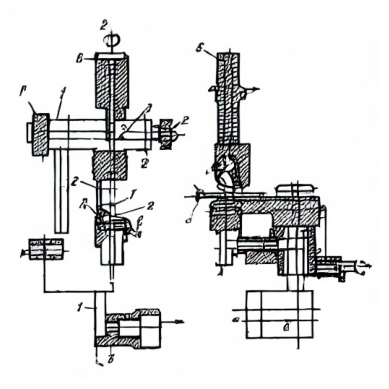

  0%|          | 0/50 [00:00<?, ?it/s]

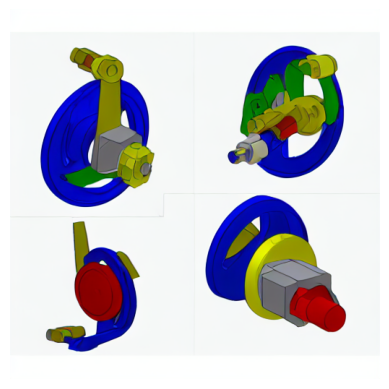

  0%|          | 0/50 [00:00<?, ?it/s]

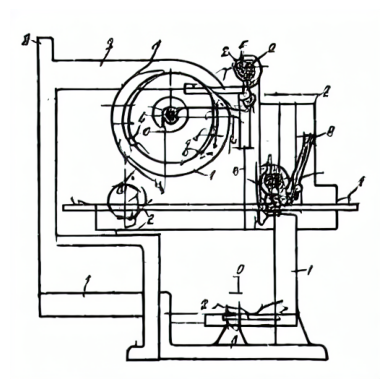

  0%|          | 0/50 [00:00<?, ?it/s]

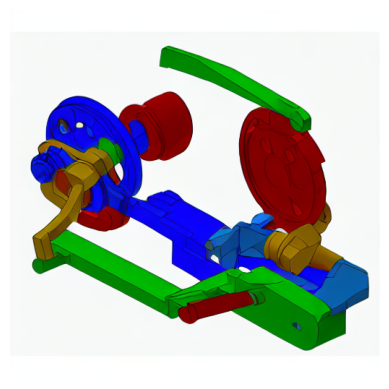

  0%|          | 0/50 [00:00<?, ?it/s]

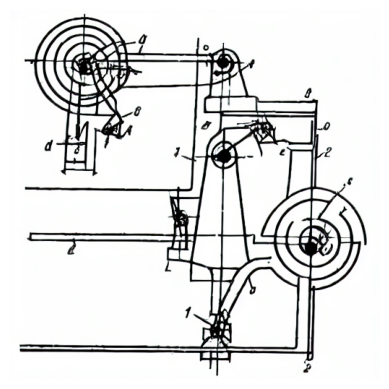

  0%|          | 0/50 [00:00<?, ?it/s]

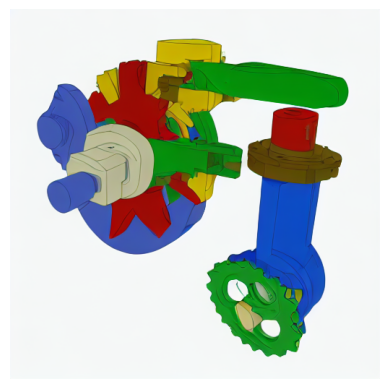

  0%|          | 0/50 [00:00<?, ?it/s]

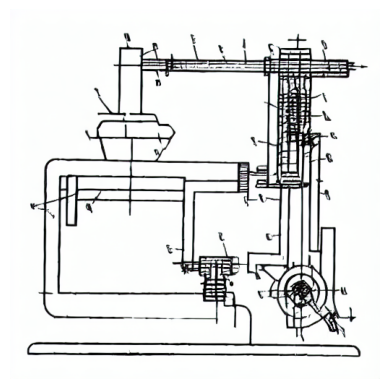

  0%|          | 0/50 [00:00<?, ?it/s]

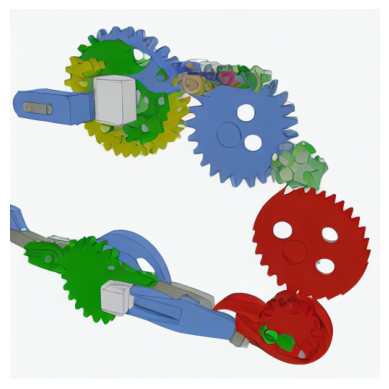

  0%|          | 0/50 [00:00<?, ?it/s]

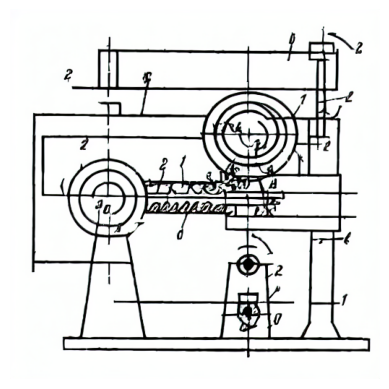

  0%|          | 0/50 [00:00<?, ?it/s]

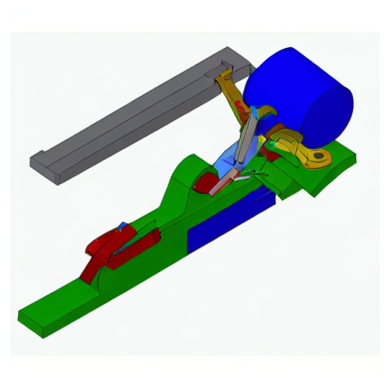

  0%|          | 0/50 [00:00<?, ?it/s]

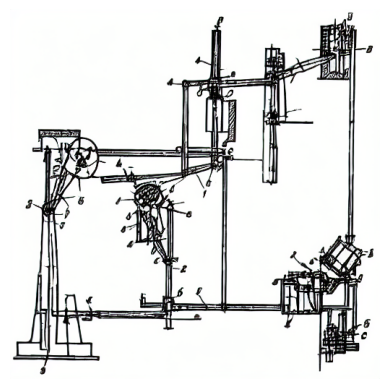

  0%|          | 0/50 [00:00<?, ?it/s]

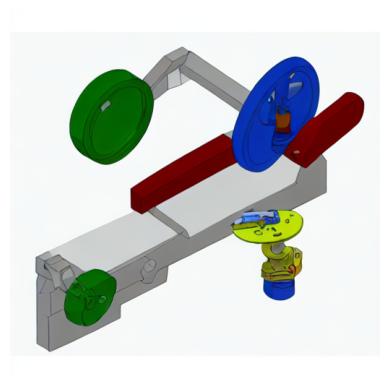

  0%|          | 0/50 [00:00<?, ?it/s]

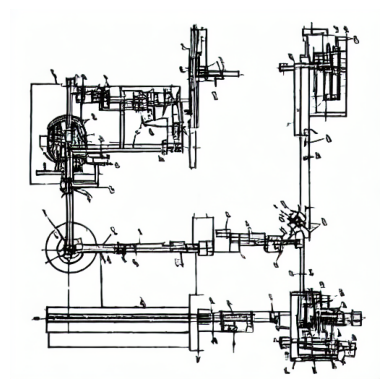

  0%|          | 0/50 [00:00<?, ?it/s]

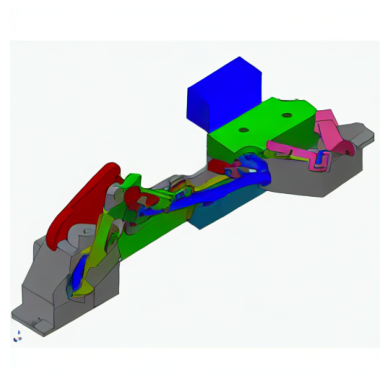

  0%|          | 0/50 [00:00<?, ?it/s]

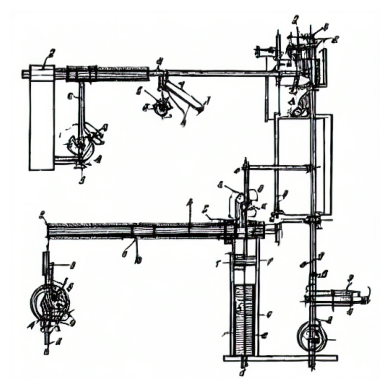

  0%|          | 0/50 [00:00<?, ?it/s]

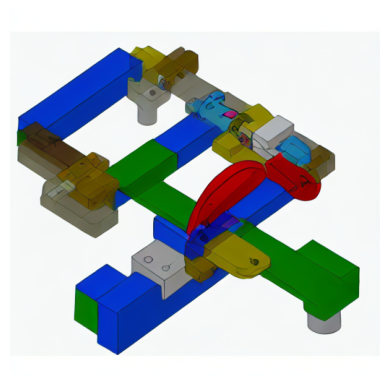

  0%|          | 0/50 [00:00<?, ?it/s]

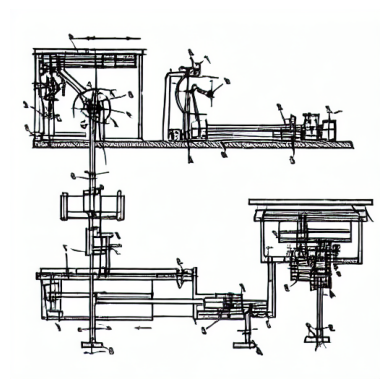

  0%|          | 0/50 [00:00<?, ?it/s]

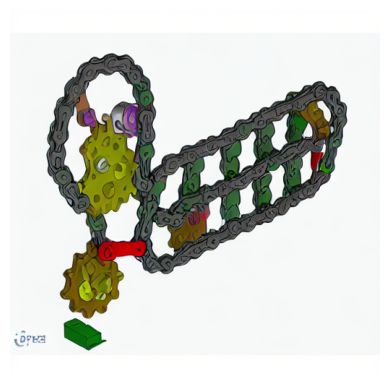

  0%|          | 0/50 [00:00<?, ?it/s]

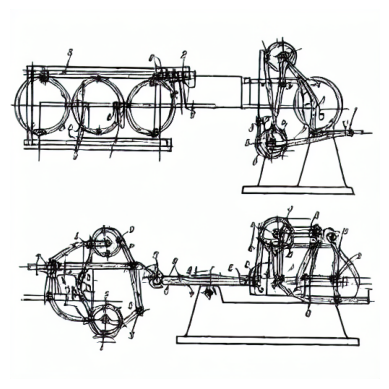

  0%|          | 0/50 [00:00<?, ?it/s]

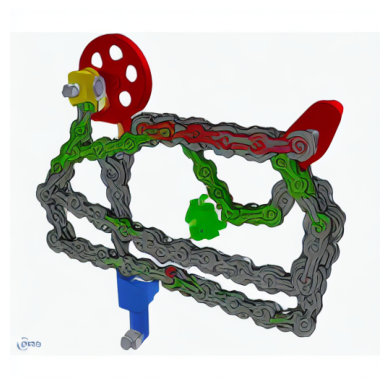

  0%|          | 0/50 [00:00<?, ?it/s]

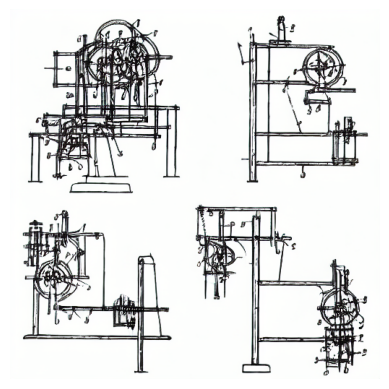

  0%|          | 0/50 [00:00<?, ?it/s]

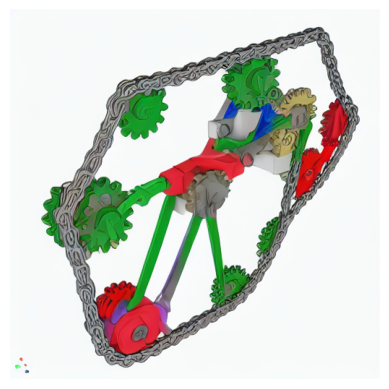

  0%|          | 0/50 [00:00<?, ?it/s]

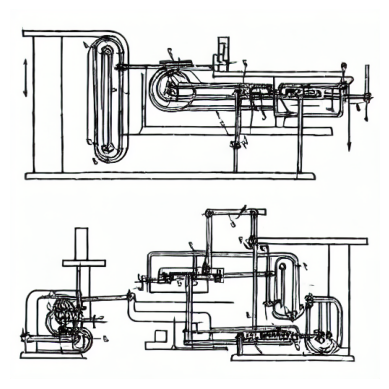

  0%|          | 0/50 [00:00<?, ?it/s]

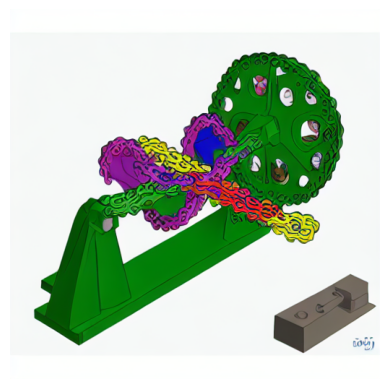

  0%|          | 0/50 [00:00<?, ?it/s]

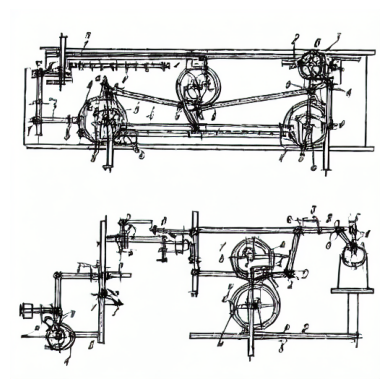

In [ ]:
%cd /content/

all_prompts = [
    "Lever. A simple machine that amplifies force by pivoting on a fulcrum.",
    "Pulley. A wheel with a grooved rim around which a cord passes; used to lift loads.",
    "Gear. A rotating machine part with cut teeth that engage with another gear to transmit torque.",
    "Cam and Follower. A rotating or sliding piece in a mechanical linkage that drives a follower in a specific motion.",
    "Crankshaft. Converts reciprocating (linear) motion into rotational motion, commonly used in engines.",
    "Linkage. A series of rigid links connected by joints to transfer motion and force.",
    "Screw. A mechanism that converts rotational motion into linear motion, often used to fasten objects together.",
    "Ratchet. A mechanical device that allows continuous linear or rotary motion in only one direction while preventing motion in the opposite direction.",
    "Slider-Crank. A mechanism that converts rotational motion into linear motion or vice versa, often used in piston engines.",
    "Chain Drive. A method of transmitting mechanical power between two rotating shafts using a chain that meshes with sprockets on the shafts."
]



for indx, myprompt in enumerate(all_prompts):
    for k in range(4):
      image = pipe(prompt="3D sketch. " + myprompt).images[0]
      image_3d_path = str(indx) + "_" + str(k) + "_3D.png"
      image.save(image_3d_path)
      plt.imshow(image)
      plt.axis('off')
      plt.show()

      shutil.move(image_3d_path, os.path.join(destination_folder, image_3d_path))

      image = pipe(prompt="2D schematics. " + myprompt).images[0]
      image_2d_path = str(indx) + "_" + str(k) + "_2D.png"
      image.save(image_2d_path)
      plt.imshow(image)
      plt.axis('off')
      plt.show()

      shutil.move(image_2d_path, os.path.join(destination_folder, image_2d_path))

